# ML Final Project
Group Members: Mohammed Hassan, Grace He, Aaron Posadas, Jamie Wong

In [5]:
# imports
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.impute import KNNImputer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from numpy import mean
from numpy import std
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_predict
import warnings
warnings.simplefilter("ignore")
from sklearn.naive_bayes import GaussianNB
from sklearn.neural_network import MLPClassifier
import sklearn as sk
from google.colab import files
uploaded = files.upload()

ModuleNotFoundError: No module named 'google'

## Table of Contents: <a class="anchor" id="toc"></a>
Click on the hyperlink to navigate to the respective header. The header will also have a hyperlink to navigate back to the Table of Contents :)
* [Preview](#preview)
* [Cleaning and Exploration](#c&e)
* [Thoughts on Feature Engineering/Reduction](#fe)
* Imputation
    * [Mean-Imputation](#mean_imp)
    * [Median-Imputation](#median_imp)
    * [KNN-Imputation (Fancy)](#fancy_knn)
    * [KNN-Imputation (Sci-kit)](#sci_knn)
* [Decision Tree Classifier](#dtc)
    * [Decision Tree Classifier Findings](#dt_find)
* [Random Forest Classifier](#rfc)
    * [Random Forest Classifier Findings](#rfc_find)
* [Naive Bayes Classifier](#nbc)
    * [Naive Bayes Classifier Findings](#nbc_find)
* [Neural Nets Classifier](#nnc)
    * [Neural Nets Classifier Findings](#nnc_find)
* [SVM Classifier](#svmc)
    * [SVM Classifier Findings](#svm_find)
* [KNN Classifier](#knnc)
    * [KNN Classifier Findings](#knnc_find)
* [Ensemble Classifier](#ec)
    * [Ensemble Classifier Findings](#ec_find)
* [Final Thoughts](#conc)
    

# [Preview](#toc) <a class="anchor" id="preview"></a>

Our dataset is a list of results of water quality tests on different bodies of water. It is a labeled dataset based on the water's potability (whether or not the water is safe to drink.

In [6]:
data = pd.read_csv('water_potability.csv')
data.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,NaN,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,NaN,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,NaN,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0


This dataset has <b>3276</b> records and has <b>10</b> features (9 features not including class label):
1. <b>ph:</b> pH of 1. water (0 to 14).
2. <b>Hardness:</b> Capacity of water to precipitate soap in mg/L.
3. <b>Solids:</b> Total dissolved solids in ppm.
4. <b>Chloramines:</b> Amount of Chloramines in ppm.
5. <b>Sulfate:</b> Amount of Sulfates dissolved in mg/L.
6. <b>Conductivity:</b> Electrical conductivity of water in μS/cm.
7. <b>Organic_carbon:</b> Amount of organic carbon in ppm.
8. <b>Trihalomethanes:</b> Amount of Trihalomethanes in μg/L.
9. <b>Turbidity:</b> Measure of light emiting property of water in NTU.
10. <b>Potability:</b> Indicates if water is safe for human consumption. Potable = 1 and Not potable = 0

Our initial goal is to use different classifiers to analyze the effect of different features on water potability and determine if the given data can help us create a machine learning algorithm that can, given the appropriate data, predict water potability with reasonable accuracy. 

## [Cleaning and Exploration](#toc) <a class="anchor" id="c&e"></a>

In [7]:
data = pd.read_csv('water_potability.csv')
print(data.isnull().sum())
print("\nTotal num missing values:", data.isnull().sum().sum())

ph                 491
Hardness             0
Solids               0
Chloramines          0
Sulfate            781
Conductivity         0
Organic_carbon       0
Trihalomethanes    162
Turbidity            0
Potability           0
dtype: int64

Total num missing values: 1434


With our data, it seems like the missing data is consolidated in three features: pH, sulfate, and trihalomethanes.

### Looking for Correlations:
One of the first approaches we considered was imputing values based on their correlation with other values. However, we did not see any features that had a high correlation with each other so we concluded that we cannot use similar records from different features to replace missing values. 

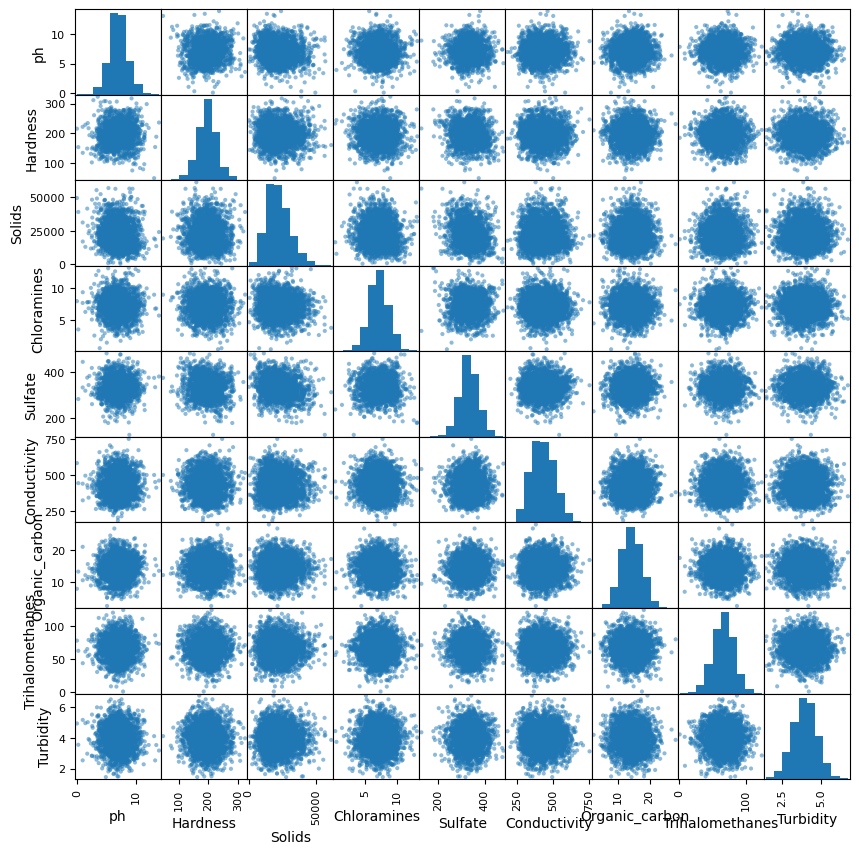

In [8]:
df_no_labels = data.drop(labels=['Potability'], axis=1)
pd.plotting.scatter_matrix(df_no_labels, figsize=(10,10))
plt.show()

### Plot to see shape of data 
We look at the data with dropping NaN's so each looks like a bellcurve. This leads us to believe we can try using strategies like mean or median to replace NaN's. 

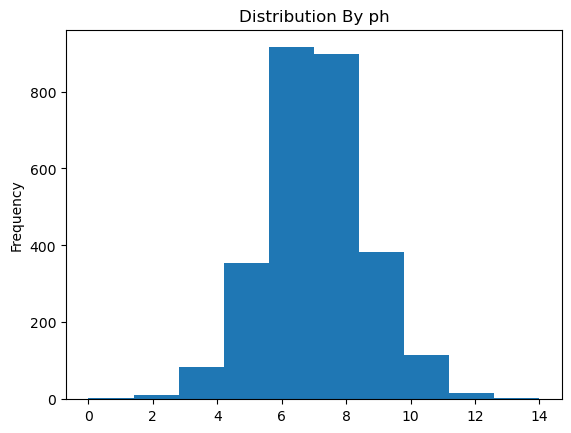

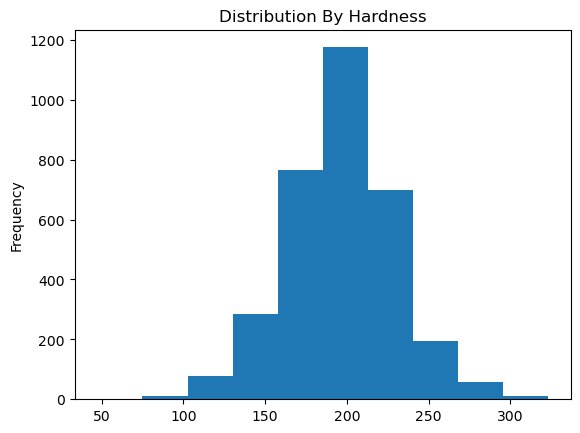

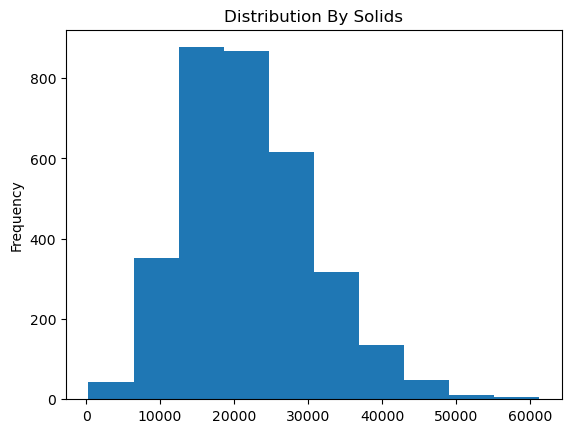

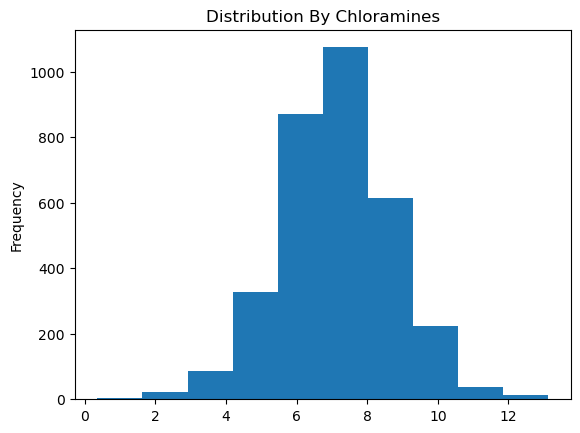

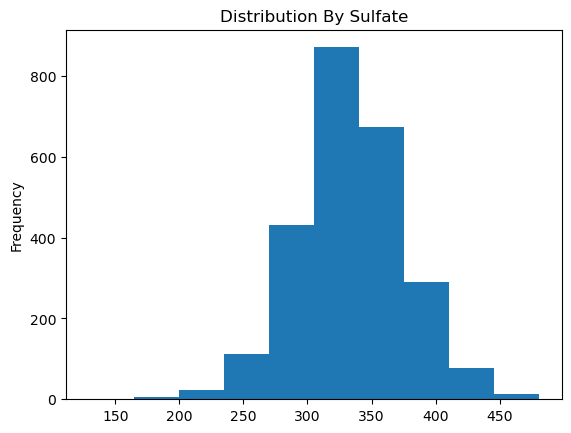

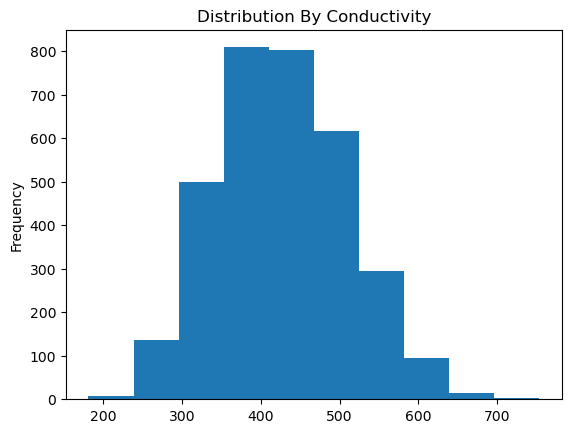

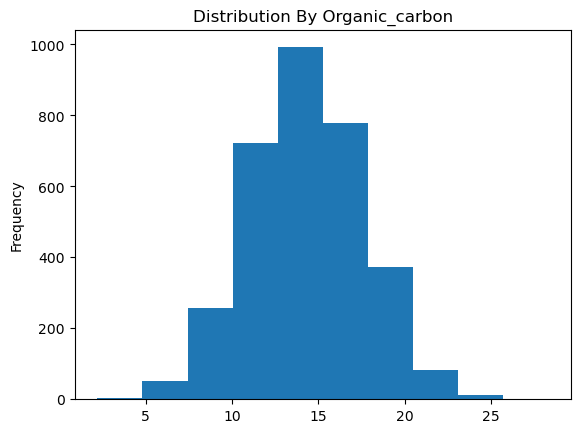

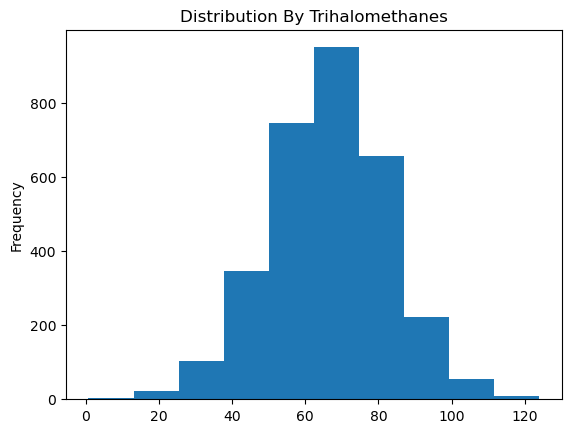

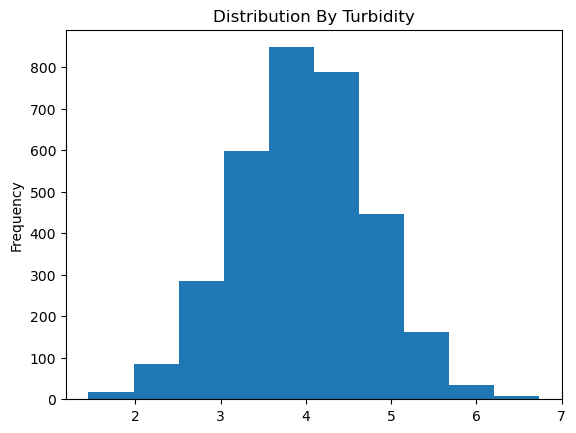

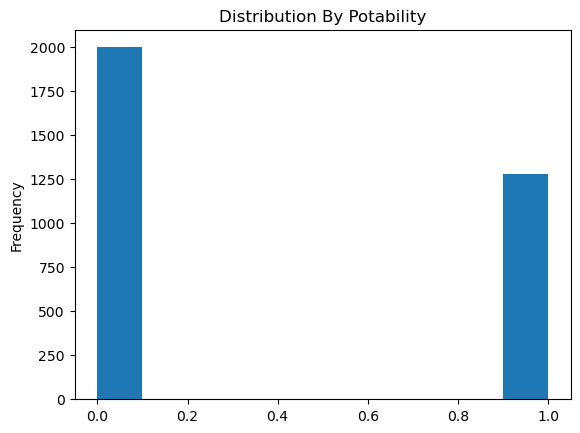

In [9]:
# with dropping
column_headers = list(data.columns.values)
for x in range(10):
    title = "Distribution By " + column_headers[x]
    data[column_headers[x]].plot(kind='hist', title=title);
    plt.show()

However, using mean and median runs into the risk of imputing a mean value on a record that would be considered an outlier. As a result, we considered trying KNN imputation in addition to mean and median imputation and compare accuracies to analyze the affect of the different types of imputation and the nature of the records that have missing data.

In [10]:
print(data['Potability'].value_counts())

0    1998
1    1278
Name: Potability, dtype: int64


We should also note the class imbalance in our data: we have more records that are labeled as non-potable than potable, with roughly 60% of the data being bodies of non-potable water. 

## Imputation Using Mean <a class="anchor" id="mean_imp"></a>

In [11]:
# attributes with NaN's: ph, sulfate, Trihalomethanes

mean_data = data.copy()

# ph
ph_mean = mean_data['ph'].mean() 
mean_data['ph'].fillna(value=ph_mean, inplace=True)

# sulfate
sulfate_mean = mean_data['Sulfate'].mean() 
mean_data['Sulfate'].fillna(value=sulfate_mean, inplace=True)

#Trihalomethanes
trihalomethanes_mean = mean_data['Trihalomethanes'].mean() 
mean_data['Trihalomethanes'].fillna(value=trihalomethanes_mean, inplace=True)

print(mean_data.isnull().sum())
print("\nTotal num missing values:",mean_data.isnull().sum().sum())

mean_data.head()

ph                 0
Hardness           0
Solids             0
Chloramines        0
Sulfate            0
Conductivity       0
Organic_carbon     0
Trihalomethanes    0
Turbidity          0
Potability         0
dtype: int64

Total num missing values: 0


,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,7.080795,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,333.775777,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,333.775777,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0


## [Imputation Using Median](#toc) <a class="anchor" id="median_imp"></a>

In [12]:
# attributes with NaN's: ph, sulfate, Trihalomethanes
# ph

median_data = data.copy()

ph_median = median_data['ph'].median() 
median_data['ph'].fillna(value=ph_median, inplace=True)

# sulfate
sulfate_median = median_data['Sulfate'].median() 
median_data['Sulfate'].fillna(value=sulfate_median, inplace=True)

#Trihalomethanes
trihalomethanes_median = median_data['Trihalomethanes'].median() 
median_data['Trihalomethanes'].fillna(value=trihalomethanes_median, inplace=True)

print(median_data.isnull().sum())
print("\nTotal num missing values:", median_data.isnull().sum().sum())

median_data.head()

ph                 0
Hardness           0
Solids             0
Chloramines        0
Sulfate            0
Conductivity       0
Organic_carbon     0
Trihalomethanes    0
Turbidity          0
Potability         0
dtype: int64

Total num missing values: 0


,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,7.036752,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,333.073546,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,333.073546,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0


## [Imputation using KNN](#toc) <a class="anchor" id="knn_imp"></a>

Imputation using KNN can have multiple different ways of implementation. Additionally, we also have to be careful of the value of k that we use. We found two different implementations of KNN imputation, one from the fancyimpute library and the other from sci-kit learn. The two have impute slightly different values due to the difference in how they measure distance between records. For our purposes, we will be using sci-kit learn's implementation since we have its documentation more readily available, though the fancyimpute implementation would likely yield more accurate results. Of course, using KNN imputation in general runs the risk of overfitting our data, but we believe it would be better than mean and median as the imputed values would more accurately reflect each record's placement in the data. 

### [Using fancy impute](#toc) <a class="anchor" id="fancy_knn"></a>
fancyimpute package: https://pypi.org/project/fancyimpute/

In [13]:
pip install fancyimpute

In [14]:
from fancyimpute import KNN
# X is the complete data matrix
# X_incomplete has the same values as X except a subset have been replace with NaN

# Use 3 nearest rows which have a feature to fill in each row's missing features
X_filled_knn = KNN(k=11).fit_transform(data)
new_df = pd.DataFrame(X_filled_knn, columns=data.columns)
new_df

Imputing row 1/3276 with 1 missing, elapsed time: 4.874
Imputing row 101/3276 with 0 missing, elapsed time: 4.879
Imputing row 201/3276 with 0 missing, elapsed time: 4.890
Imputing row 301/3276 with 1 missing, elapsed time: 4.895
Imputing row 401/3276 with 0 missing, elapsed time: 4.895
Imputing row 501/3276 with 0 missing, elapsed time: 4.895
Imputing row 601/3276 with 1 missing, elapsed time: 4.908
Imputing row 701/3276 with 1 missing, elapsed time: 4.912
Imputing row 801/3276 with 0 missing, elapsed time: 4.920
Imputing row 901/3276 with 1 missing, elapsed time: 4.923
Imputing row 1001/3276 with 0 missing, elapsed time: 4.928
Imputing row 1101/3276 with 1 missing, elapsed time: 4.928
Imputing row 1201/3276 with 0 missing, elapsed time: 4.936
Imputing row 1301/3276 with 0 missing, elapsed time: 4.944
Imputing row 1401/3276 with 0 missing, elapsed time: 4.944
Imputing row 1501/3276 with 0 missing, elapsed time: 4.957
Imputing row 1601/3276 with 0 missing, elapsed time: 4.961
Imputing 

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,7.272154,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0.0
1,3.716080,129.422921,18630.057858,6.635246,339.122462,592.885359,15.180013,56.329076,4.500656,0.0
2,8.099124,224.236259,19909.541732,9.275884,335.550342,418.606213,16.868637,66.420093,3.055934,0.0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0.0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0.0
...,...,...,...,...,...,...,...,...,...,...
3271,4.668102,193.681735,47580.991603,7.166639,359.948574,526.424171,13.894419,66.687695,4.435821,1.0
3272,7.808856,193.553212,17329.802160,8.061362,339.370089,392.449580,19.903225,54.792204,2.798243,1.0
3273,9.419510,175.762646,33155.578218,7.350233,332.921531,432.044783,11.039070,69.845400,3.298875,1.0
3274,5.126763,230.603758,11983.869376,6.303357,337.877015,402.883113,11.168946,77.488213,4.708658,1.0


### [Using Scikit Learn](#toc) <a class="anchor" id="sci_knn"></a>
Using a Random Forest Classifier, we will measure the accuracy of the KNNImputer with varying values of k to determine the ideal value of k. Then, we use KNNImputer() from sci-kit learn to impute the values based on nearest neighbors. For our implementation, we decided to use the 'distance' parameter for measuring weights.

The following implementation followed this guide: https://machinelearningmastery.com/knn-imputation-for-missing-values-in-machine-learning/

>1 0.658 (0.018)
>3 0.672 (0.021)
>5 0.669 (0.023)
>7 0.668 (0.016)
>9 0.666 (0.019)
>11 0.668 (0.018)
>13 0.671 (0.018)
>15 0.676 (0.019)
>17 0.670 (0.018)
>19 0.665 (0.014)
>21 0.668 (0.018)


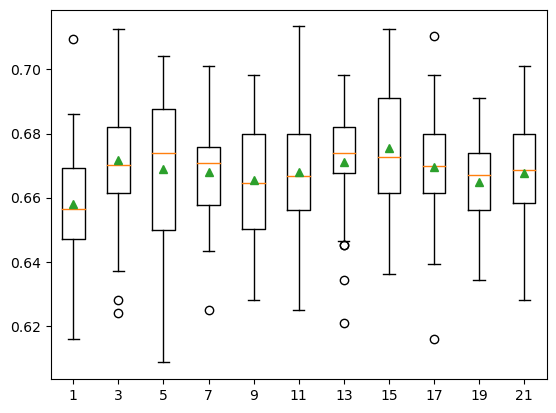

In [15]:
## Trying KNN imputation, evaluating accuracy with RandomForestClassifier
# knn = 11 seems best
dataframe = data
data = dataframe.values # dataframe = the original dataframe without dropped values
ix = [i for i in range(data.shape[1]) if i != 9]
X, y = data[:, ix], data[:, 9]
# evaluate each strategy on the dataset
results = list()
strategies = [str(i) for i in [1,3,5,7,9,11,13,15,17,19,21]]
for s in strategies:
    # create the modeling pipeline
    pipeline = Pipeline(steps=[('i', KNNImputer(n_neighbors=int(s), weights='distance')), ('m', RandomForestClassifier())])
    # evaluate the model
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
    scores = cross_val_score(pipeline, X, y, scoring='accuracy', cv=cv, n_jobs=-1)
    # store results
    results.append(scores)
    print('>%s %.3f (%.3f)' % (s, mean(scores), std(scores)))
# plot model performance for comparison
plt.boxplot(results, labels=strategies, showmeans=True)
plt.show()

Based on the boxplot and accuracies, k=9 seems to be the ideal value that minimizes variance/outliers (the green triangle is closer to the median) while also maximizing accuracy. 

The following code performs the imputation:

In [16]:
from numpy import isnan
import numpy as np

data = dataframe.values
ix = [i for i in range(data.shape[1]) if i != 9]
X, y = data[:, ix], data[:, 9]
# print total missing
print('Missing: %d' % sum(isnan(X).flatten()))
# define imputer
imputer = KNNImputer(n_neighbors=9, weights='distance')
# fit on the dataset
imputer.fit(X)
# transform the dataset
Xtrans = imputer.transform(X)
# print total missing
print('Missing: %d' % sum(isnan(Xtrans).flatten()))
#Xtrans is new numpy (excluding labels) with imputed values
full_data = pd.DataFrame(Xtrans)
full_data['Potability'] = dataframe['Potability']
full_data.columns = dataframe.columns
#full_data is dataframe with imputed values including labels
data = dataframe
full_data.head()

Missing: 1434
Missing: 0


,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,7.165491,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,335.494648,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,328.899274,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0


## Thoughts on Feature Engineering and Feature Reduction <a class="anchor" id="fe"></a>

For our data, feature engineering did not seem ideal. Though the provided data had very few features compared to other datasets, the features were generally very unique (amounts of certain compounds/substances). One idea that could be considered would be the respective ratio of two different substances, but ultimately adding features from the given data without being able to directly gather the data would likely result in redundant data. As a result, we decided to explore more on the difference in imputation methods and ensembling. 

# [Decision Tree](#toc) <a class="anchor" id="dtc"></a>

### KNN Imputation Data

In [17]:
# splitting data into features and labels, NOTE: data is data with knn imputation
features = full_data.loc[:, full_data.columns != 'Potability']
labels = full_data.loc[:, full_data.columns == 'Potability']

print("features shape:",features.shape)
print("labels len:", len(labels))
print("features head:", features.head())

features shape: (3276, 9)
labels len: 3276
features head:          ph    Hardness        Solids  Chloramines     Sulfate  Conductivity  \
0  7.165491  204.890455  20791.318981     7.300212  368.516441    564.308654   
1  3.716080  129.422921  18630.057858     6.635246  335.494648    592.885359   
2  8.099124  224.236259  19909.541732     9.275884  328.899274    418.606213   
3  8.316766  214.373394  22018.417441     8.059332  356.886136    363.266516   
4  9.092223  181.101509  17978.986339     6.546600  310.135738    398.410813   

   Organic_carbon  Trihalomethanes  Turbidity  
0       10.379783        86.990970   2.963135  
1       15.180013        56.329076   4.500656  
2       16.868637        66.420093   3.055934  
3       18.436524       100.341674   4.628771  
4       11.558279        31.997993   4.075075  


In [18]:
# train test split
features_train, features_test, labels_train, labels_test = train_test_split(features, labels, test_size=0.2)
print("Records in train set:", len(features_train))
print("Records in test set:", len(features_test))

# decision tree classifiers
clf = DecisionTreeClassifier(criterion='entropy')
clf = clf.fit(features_train, labels_train)

# predict
predicted = clf.predict(features_test)

# score
score = accuracy_score(labels_test, predicted)
print("Classifier Accuracy:", score)

Records in train set: 2620
Records in test set: 656
Classifier Accuracy: 0.5792682926829268


Tune the hyper parameters:

In [19]:
# nested cross validation

clf = DecisionTreeClassifier(criterion='gini')

# want to avoid overfitting because we do not have a lot of data
parameters = {"max_depth": [5, 10, 15, 20],"min_samples_leaf": [2, 5, 10, 15, 20]}
grid_search = GridSearchCV(clf, parameters, cv=5, scoring='accuracy')

grid_search.fit(features, labels)

print("Grid Search Best Parameters", grid_search.best_params_)
print("Grid Search Accuracy:", grid_search.best_score_)

# get the nested cross validation score
nested = cross_val_score(grid_search, features, labels)

print("KNN Imputed Generalization Accuracy:", nested.mean())

Grid Search Best Parameters {'max_depth': 5, 'min_samples_leaf': 2}
Grid Search Accuracy: 0.6346159932973375
KNN Imputed Generalization Accuracy: 0.6132535840625581


### Mean Imputation Data

In [20]:
# splitting data into features and labels, NOTE: data is data with knn imputation
features = mean_data.loc[:, mean_data.columns != 'Potability']
labels = mean_data.loc[:, mean_data.columns == 'Potability']

print("features shape:",features.shape)
print("labels len:", len(labels))
print("features head:", features.head())

features shape: (3276, 9)
labels len: 3276
features head:          ph    Hardness        Solids  Chloramines     Sulfate  Conductivity  \
0  7.080795  204.890455  20791.318981     7.300212  368.516441    564.308654   
1  3.716080  129.422921  18630.057858     6.635246  333.775777    592.885359   
2  8.099124  224.236259  19909.541732     9.275884  333.775777    418.606213   
3  8.316766  214.373394  22018.417441     8.059332  356.886136    363.266516   
4  9.092223  181.101509  17978.986339     6.546600  310.135738    398.410813   

   Organic_carbon  Trihalomethanes  Turbidity  
0       10.379783        86.990970   2.963135  
1       15.180013        56.329076   4.500656  
2       16.868637        66.420093   3.055934  
3       18.436524       100.341674   4.628771  
4       11.558279        31.997993   4.075075  


In [21]:
# train test split
features_train, features_test, labels_train, labels_test = train_test_split(features, labels, test_size=0.2)
print("Records in train set:", len(features_train))
print("Records in test set:", len(features_test))

# decision tree classifiers
clf = DecisionTreeClassifier(criterion='entropy')
clf = clf.fit(features_train, labels_train)

# predict
predicted = clf.predict(features_test)

# score
score = accuracy_score(labels_test, predicted)
print("Classifier Accuracy:", score)

Records in train set: 2620
Records in test set: 656
Classifier Accuracy: 0.5838414634146342


Tune the hyperparameters:

In [22]:
# nested cross validation

clf = DecisionTreeClassifier(criterion='gini')

# want to avoid overfitting because we do not have a lot of data
parameters = {"max_depth": [5, 10, 15, 20],"min_samples_leaf": [2, 5, 10, 15, 20]}
grid_search = GridSearchCV(clf, parameters, cv=5, scoring='accuracy')

grid_search.fit(features, labels)

print("Grid Search Best Parameters", grid_search.best_params_)
print("Grid Search Accuracy:", grid_search.best_score_)

# get the nested cross validation score
nested = cross_val_score(grid_search, features, labels)

print("Mean Imputed Generalization Accuracy with Gini:", nested.mean())

Grid Search Best Parameters {'max_depth': 5, 'min_samples_leaf': 2}
Grid Search Accuracy: 0.6175297896108731
Mean Imputed Generalization Accuracy with Gini: 0.6123389499162167


### Median Imputation Data

In [23]:
# splitting data into features and labels, NOTE: data is data with Median imputation
features = median_data.loc[:, median_data.columns != 'Potability']
labels = median_data.loc[:, median_data.columns == 'Potability']

print("features shape:",features.shape)
print("labels len:", len(labels))
print("features head:", features.head())

features shape: (3276, 9)
labels len: 3276
features head:          ph    Hardness        Solids  Chloramines     Sulfate  Conductivity  \
0  7.036752  204.890455  20791.318981     7.300212  368.516441    564.308654   
1  3.716080  129.422921  18630.057858     6.635246  333.073546    592.885359   
2  8.099124  224.236259  19909.541732     9.275884  333.073546    418.606213   
3  8.316766  214.373394  22018.417441     8.059332  356.886136    363.266516   
4  9.092223  181.101509  17978.986339     6.546600  310.135738    398.410813   

   Organic_carbon  Trihalomethanes  Turbidity  
0       10.379783        86.990970   2.963135  
1       15.180013        56.329076   4.500656  
2       16.868637        66.420093   3.055934  
3       18.436524       100.341674   4.628771  
4       11.558279        31.997993   4.075075  


In [24]:
# train test split
features_train, features_test, labels_train, labels_test = train_test_split(features, labels, test_size=0.2)
print("Records in train set:", len(features_train))
print("Records in test set:", len(features_test))

# decision tree classifiers
clf = DecisionTreeClassifier(criterion='entropy')
clf = clf.fit(features_train, labels_train)

# predict
predicted = clf.predict(features_test)

# score
score = accuracy_score(labels_test, predicted)
print("Classifier Accuracy:", score)

Records in train set: 2620
Records in test set: 656
Classifier Accuracy: 0.5655487804878049


Tune the hyperparameters:

In [25]:
# nested cross validation

clf = DecisionTreeClassifier(criterion='gini')

# want to avoid overfitting because we do not have a lot of data
parameters = {"max_depth": [5, 10, 15, 20],"min_samples_leaf": [2, 5, 10, 15, 20]}
grid_search = GridSearchCV(clf, parameters, cv=5, scoring='accuracy')

grid_search.fit(features, labels)

print("Grid Search Best Parameters", grid_search.best_params_)
print("Grid Search Accuracy:", grid_search.best_score_)

# get the nested cross validation score
nested = cross_val_score(grid_search, features, labels)

print("Median Imputed Generalization Accuracy with Gini:", nested.mean())

Grid Search Best Parameters {'max_depth': 5, 'min_samples_leaf': 5}
Grid Search Accuracy: 0.6178360640476633
Median Imputed Generalization Accuracy with Gini: 0.6126442934276671


## [Summary of Findings (Decision Tree Classifier)](#toc) <a class="anchor" id="dtc_find"></a>

Accuracies of DT on:

KNN-imputed Data = 
<br> 61.32% 


Mean-imputed Data = 
<br> 61.23% 


Median-imputed Data = 
<br>61.26% 


Based on the accuracies, it seems like KNN imputation data has the highest general accuracy (roughly 61.4%). However all of the accuracies are pretty close. This implies that the outliers do not have a huge impact on our data. 

# [Random Forest](#toc) <a class="anchor" id="rfc"></a>

### KNN Imputation Data

In [48]:
features = full_data.loc[:, full_data.columns != 'Potability']
labels = full_data.loc[:, full_data.columns == 'Potability']

rf = RandomForestClassifier()
parameters = {'n_estimators': [50, 100, 150],"max_depth": [5, 10, 15, 20],"min_samples_leaf": [2, 5, 10, 15, 20]}
clf = GridSearchCV(rf, parameters, cv=5, scoring='accuracy')
clf.fit(features, labels)
print("Grid Search Best Parameters", clf.best_params_)
print("Grid Search Accuracy:", clf.best_score_)
scores = cross_val_score(clf, features, labels, cv=5)
print("knn imputation data n_estimators Accuracy:", scores.mean())

Grid Search Best Parameters {'max_depth': 10, 'min_samples_leaf': 5, 'n_estimators': 150}
Grid Search Accuracy: 0.6453072053621299
knn imputation data n_estimators Accuracy: 0.6364536399180787


### Mean Imputation

In [49]:
features = mean_data.loc[:, mean_data.columns != 'Potability']
labels = mean_data.loc[:, mean_data.columns == 'Potability']

rf = RandomForestClassifier()
parameters = {'n_estimators': [50, 100, 150],"max_depth": [5, 10, 15, 20],"min_samples_leaf": [2, 5, 10, 15, 20]}
clf = GridSearchCV(rf, parameters, cv=5, scoring='accuracy')
clf.fit(features, labels)
print("Grid Search Best Parameters", clf.best_params_)
print("Grid Search Accuracy:", clf.best_score_)
scores = cross_val_score(clf, features, labels, cv=5)
print("mean imputation data n_estimators Accuracy:", scores.mean())

Grid Search Best Parameters {'max_depth': 20, 'min_samples_leaf': 5, 'n_estimators': 150}
Grid Search Accuracy: 0.643478402532117
mean imputation data n_estimators Accuracy: 0.6297388754421895


### Median Imputation

In [50]:
features = median_data.loc[:, median_data.columns != 'Potability']
labels = median_data.loc[:, median_data.columns == 'Potability']

rf = RandomForestClassifier()
parameters = {'n_estimators': [50, 100, 150],"max_depth": [5, 10, 15, 20],"min_samples_leaf": [2, 5, 10, 15, 20]}
clf = GridSearchCV(rf, parameters, cv=5, scoring='accuracy')
clf.fit(features, labels)
print("Grid Search Best Parameters", clf.best_params_)
print("Grid Search Accuracy:", clf.best_score_)
scores = cross_val_score(clf, features, labels, cv=5)
print("median imputation data n_estimators Accuracy:", scores.mean())

Grid Search Best Parameters {'max_depth': 15, 'min_samples_leaf': 5, 'n_estimators': 150}
Grid Search Accuracy: 0.641951684974865
median imputation data n_estimators Accuracy: 0.63767547942655


## [Summary of Findings (Random Forest Classifier)](#toc) <a class="anchor" id="rfc"></a>

Accuracies of Random Forest on:
<br> KNN-imputed data = 63.6%
<br> Mean-imputed data = 63.0%
<br> Median-imputed data = 63.8%

Based on the accuracies, the classifier seems to perform the best on the median-imputed data. However, the difference in accuracy between RFC on KNN-imputed data and RFC on median-imputed data is once again really close. 

# [Naive Bayes](#toc) <a class="anchor" id="nbc"></a>

Here we split the data into features and labels (based on the imputation) and run a Naive Bayes classifier. We don't need to run PCA since NB does not suffer as much from the curse of dimensionality.

## For KNN Imputed Data

In [51]:
features = full_data.loc[:, full_data.columns != 'Potability']
labels = full_data.loc[:, full_data.columns == 'Potability']
# splitting data into features and labels
nb = GaussianNB()
accs = sk.model_selection.cross_val_score(nb, features, labels)
print(accs)
print("Average/Official Accuracy for KNN-Imputed Data: " + str(accs.mean() * 100))

[0.61128049 0.64885496 0.58320611 0.59236641 0.62748092]
Average/Official Accuracy: 61.263777695028864


In [52]:
pred = sk.model_selection.cross_val_predict(nb, features, labels)
print("Confusion Matrix for Naive Bayes (KNN)")
print(sk.metrics.confusion_matrix(labels, pred))
print("\nClassification Report for Naive Bayes (KNN)")
print(sk.metrics.classification_report(labels, pred))

Confusion Matrix for Naive Bayes
[[1746  252]
 [1017  261]]

Classification Report for Naive Bayes
              precision    recall  f1-score   support

           0       0.63      0.87      0.73      1998
           1       0.51      0.20      0.29      1278

    accuracy                           0.61      3276
   macro avg       0.57      0.54      0.51      3276
weighted avg       0.58      0.61      0.56      3276



AUC: 59.36111574260242


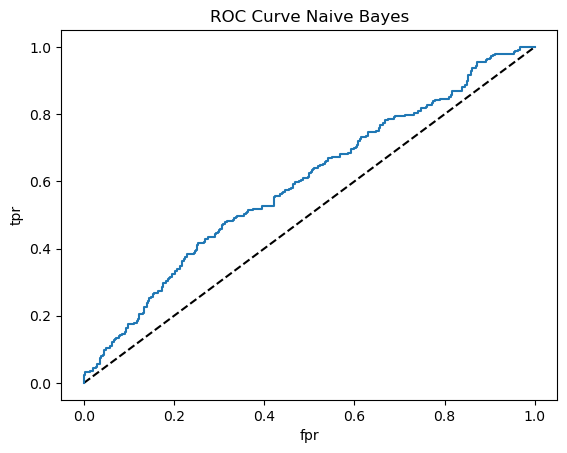

In [53]:
#splitting data into test and train sets
f_train, f_test, l_train, l_test = sk.model_selection.train_test_split(features, labels, test_size=0.2, random_state=77)
nb = GaussianNB().fit(f_train, l_train)
predictions = nb.predict_proba(f_test)

fpr, tpr, thresholds = sk.metrics.roc_curve(l_test, predictions[:,1])
print("AUC: " + str(sk.metrics.roc_auc_score(l_test, predictions[:,1])*100))

#code for plotting ROC curve
plt.plot([0,1],[0,1],'k--') #plot the diagonal line
plt.plot(fpr, tpr, label='NB') #plot the ROC curve
plt.xlabel('fpr')
plt.ylabel('tpr')
plt.title('ROC Curve Naive Bayes (KNN)')
plt.show()

## For Mean Imputed Data

In [54]:
features = mean_data.loc[:, mean_data.columns != 'Potability']
labels = mean_data.loc[:, mean_data.columns == 'Potability']
accs = sk.model_selection.cross_val_score(nb, features, labels)
print(accs)
print("Average/Official Accuracy for Mean-Imputed Data: " + str(accs.mean() * 100))

[0.60823171 0.6519084  0.58167939 0.58931298 0.6259542 ]
Average/Official Accuracy: 61.141733382982686


In [55]:
pred = sk.model_selection.cross_val_predict(nb, features, labels)
print("Confusion Matrix for Naive Bayes (Mean)")
print(sk.metrics.confusion_matrix(labels, pred))
print("\nClassification Report for Naive Bayes (Mean)")
print(sk.metrics.classification_report(labels, pred))

Confusion Matrix for Naive Bayes
[[1732  266]
 [1007  271]]

Classification Report for Naive Bayes
              precision    recall  f1-score   support

           0       0.63      0.87      0.73      1998
           1       0.50      0.21      0.30      1278

    accuracy                           0.61      3276
   macro avg       0.57      0.54      0.51      3276
weighted avg       0.58      0.61      0.56      3276



AUC: 59.19830520111026


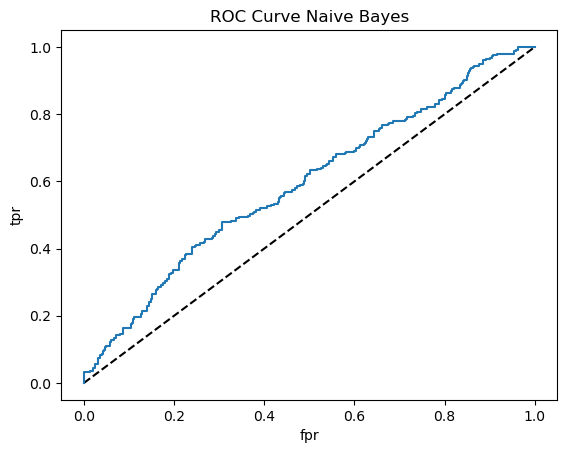

In [56]:
#splitting data into test and train sets
f_train, f_test, l_train, l_test = sk.model_selection.train_test_split(features, labels, test_size=0.2, random_state=77)
nb = GaussianNB().fit(f_train, l_train)
predictions = nb.predict_proba(f_test)

fpr, tpr, thresholds = sk.metrics.roc_curve(l_test, predictions[:,1])
print("AUC: " + str(sk.metrics.roc_auc_score(l_test, predictions[:,1])*100))

#code for plotting ROC curve
plt.plot([0,1],[0,1],'k--') #plot the diagonal line
plt.plot(fpr, tpr, label='NB') #plot the ROC curve
plt.xlabel('fpr')
plt.ylabel('tpr')
plt.title('ROC Curve Naive Bayes (Mean)')
plt.show()

## For Median Imputed Data

In [57]:
features = median_data.loc[:, median_data.columns != 'Potability']
labels = median_data.loc[:, median_data.columns == 'Potability']
accs = sk.model_selection.cross_val_score(nb, features, labels)
print(accs)
print("Average/Official Accuracy for Median-Imputed Data: " + str(accs.mean() * 100))

[0.6097561  0.6519084  0.58015267 0.58931298 0.6259542 ]
Average/Official Accuracy: 61.14168683671569


In [58]:
pred = sk.model_selection.cross_val_predict(nb, features, labels)
print("Confusion Matrix for Naive Bayes (Median)")
print(sk.metrics.confusion_matrix(labels, pred))
print("\nClassification Report for Naive Bayes (Median)")
print(sk.metrics.classification_report(labels, pred))

Confusion Matrix for Naive Bayes
[[1732  266]
 [1007  271]]

Classification Report for Naive Bayes
              precision    recall  f1-score   support

           0       0.63      0.87      0.73      1998
           1       0.50      0.21      0.30      1278

    accuracy                           0.61      3276
   macro avg       0.57      0.54      0.51      3276
weighted avg       0.58      0.61      0.56      3276



AUC: 59.21988250178993


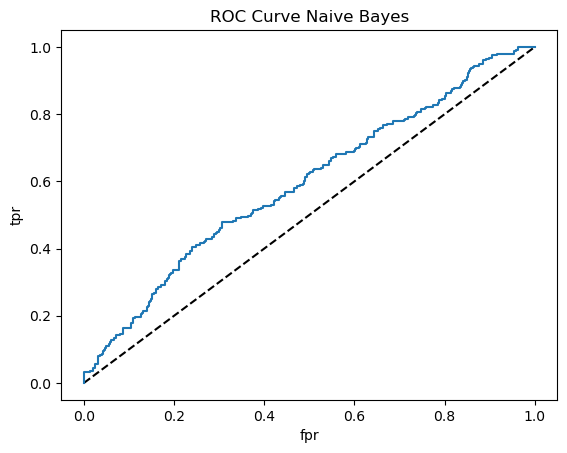

In [59]:
#splitting data into test and train sets
f_train, f_test, l_train, l_test = sk.model_selection.train_test_split(features, labels, test_size=0.2, random_state=77)
nb = GaussianNB().fit(f_train, l_train)
predictions = nb.predict_proba(f_test)

fpr, tpr, thresholds = sk.metrics.roc_curve(l_test, predictions[:,1])
print("AUC: " + str(sk.metrics.roc_auc_score(l_test, predictions[:,1])*100))

#code for plotting ROC curve
plt.plot([0,1],[0,1],'k--') #plot the diagonal line
plt.plot(fpr, tpr, label='NB') #plot the ROC curve
plt.xlabel('fpr')
plt.ylabel('tpr')
plt.title('ROC Curve Naive Bayes (Median)')
plt.show()

## [Summary of Findings (Naive Bayes Classifier)](#toc) <a class="anchor" id="nbc_find"></a>

KNN-imputed data had 61.3% accuracy and AUC score of 0.594.
<br> Mean-imputed data had 61.14% accuracy and AUC score of 0.592.
<br> Median-imputed data also had an 61.14% accuracy and AUC score of 0.592. 

The Naive Bayes results seems too mixed to call. KNN imputation leads to a lower overall accuracy (but only by 0.1%) but higher AUC score (again, only by 0.2%). Also, based on our classification reports and confusion matrices, it seems that the Naive Bayes classifier does a better job at accurately identifying non-potable water (roughly 63% precision and 87% recall) but does significantly worse in cases of potable water. This might be a better scenario since misidentifying non-potable water as potable as we discuss in [Final Thoughts](#conc).

# [Neural Nets](#toc) <a class="anchor" id="nnc"></a>

For Neural Nets, we will use a grid search to find the best parameters (hidden_layer_sizes and activation). For the sake of run time, we won't include dimensionality reduction in our grid search, though doing so would provide a compressed input into the NN algorithm that might change the accuracy.

In [60]:
nn = sk.neural_network.MLPClassifier()
ss = sk.preprocessing.StandardScaler()
params3 = [{
    'nn__hidden_layer_sizes': [(30, ), (40, ), (50, ), (60, )],
    'nn__activation': ['logistic', 'tanh', 'relu'],
}]
pipe = sk.pipeline.Pipeline([('scaler', ss), ('nn', nn)])
gscv = sk.model_selection.GridSearchCV(pipe, param_grid = params3, scoring='accuracy', cv=5)

## For KNN Imputed Data

In [61]:
features = full_data.loc[:, full_data.columns != 'Potability']
labels = full_data.loc[:, full_data.columns == 'Potability']
acc = sk.model_selection.cross_val_score(gscv, features, labels, cv=5)
print("Average Accuracy of Neural Net for KNN Imputation: " + str(acc.mean() * 100))

Average Accuracy of Neural Net for KNN Imputation: 62.57726680320238


## For Mean Imputed Data

In [62]:
features = mean_data.loc[:, mean_data.columns != 'Potability']
labels = mean_data.loc[:, mean_data.columns == 'Potability']
acc = sk.model_selection.cross_val_score(gscv, features, labels, cv=5)
print("Average Accuracy of Neural Net for Mean Imputation: " + str(acc.mean() * 100))

Average Accuracy of Neural Net for Mean Imputation: 62.97421336808788


## For Median Imputed Data

In [63]:
features = median_data.loc[:, median_data.columns != 'Potability']
labels = median_data.loc[:, median_data.columns == 'Potability']
acc = sk.model_selection.cross_val_score(gscv, features, labels, cv=5)
print("Average Accuracy of Neural Net for Median Imputation: " + str(acc.mean() * 100))

Average Accuracy of Neural Net for Median Imputation: 63.218301992180216


## [Summary of Findings (Neural Nets Classifier)](#toc) <a class="anchor" id="nnc_find"></a>

Accuracies of NN on:

KNN-imputed Data = 62.6%
<br> Median-imputed Data = 63.2%
<br> Mean-imputed Data = 63.0%

Based on the results, it seems that Median Imputation had the best performance while Mean and KNN imputation had slightly lower accuracies. Based on the nature of Neural Net algorithms, it is hard to say what features contributed to the predictions/accuracies, but ultimately the method of imputation when comparing median and mean-imputed data has a very small impact on accuracy. It does still contribute towards the trend of the classifiers having a higher accuracy when being trained on median-imputed data. 

# [SVM](#toc) <a class="anchor" id="svmc"></a>

### For KNN-Imputed Data


Here we create a pipeline that includes scaling, PCA, and an sklearn.svm.SVC, create a parameter grid that tries number of dimensions from 5-19 and SVM kernels linear, rbf and poly, and a GridSearchCV for the inner CV loop using a 5-fold CV.
Finally, we run a cross_val_predict with a 10-fold CV for the outer loop.
Then we print out the accuracy and the classification report of using an SVM classifier on this data.

In [64]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV, cross_val_predict
from sklearn.metrics import accuracy_score, classification_report

features = full_data.loc[:, full_data.columns != 'Potability']
labels = full_data.loc[:, full_data.columns == 'Potability']

pipe = Pipeline([
    ('scale', StandardScaler()),
    ('pca', PCA()),
    ('svm', SVC())
])

param_grid = {
    'pca__n_components': range(5, 9),
    'svm__kernel': ['linear', 'rbf', 'poly']
}
grid_search = GridSearchCV(pipe, param_grid, cv=5)
y_pred = cross_val_predict(grid_search, features, labels, cv=10)
acc = accuracy_score(labels, y_pred)
print("Accuracy of SVM: ", acc)
print(classification_report(labels, y_pred))

Accuracy of SVM:  0.6285103785103785
              precision    recall  f1-score   support

           0       0.64      0.92      0.75      1998
           1       0.58      0.18      0.27      1278

    accuracy                           0.63      3276
   macro avg       0.61      0.55      0.51      3276
weighted avg       0.61      0.63      0.56      3276



### For Median-Imputed Data

In [65]:
features = median_data.loc[:, full_data.columns != 'Potability']
labels = median_data.loc[:, full_data.columns == 'Potability']

y_pred = cross_val_predict(grid_search, features, labels, cv=10)
acc = accuracy_score(labels, y_pred)
print("Accuracy of SVM: ", acc)
print(classification_report(labels, y_pred))

Accuracy of SVM:  0.6312576312576312
              precision    recall  f1-score   support

           0       0.64      0.92      0.75      1998
           1       0.59      0.17      0.27      1278

    accuracy                           0.63      3276
   macro avg       0.62      0.55      0.51      3276
weighted avg       0.62      0.63      0.56      3276



### For Mean-Imputed Data

In [66]:
features = mean_data.loc[:, full_data.columns != 'Potability']
labels = mean_data.loc[:, full_data.columns == 'Potability']

y_pred = cross_val_predict(grid_search, features, labels, cv=10)
acc = accuracy_score(labels, y_pred)
print("Accuracy of SVM: ", acc)
print(classification_report(labels, y_pred))

Accuracy of SVM:  0.6303418803418803
              precision    recall  f1-score   support

           0       0.64      0.92      0.75      1998
           1       0.59      0.17      0.26      1278

    accuracy                           0.63      3276
   macro avg       0.61      0.55      0.51      3276
weighted avg       0.62      0.63      0.56      3276



## [Summary of Findings (SVM Findings)](#toc) <a class="anchor" id="svm_find"></a>

Accuracy of SVM on: 

KNN-imputed Data = 62.9% 
<br> Median-imputed Data = 63.1% 
<br> Mean-imputed Data = 63.0% 

Generally, the SVM classifier seems to have the highest accuracy on median-imputed data, aligning with most other classifiers we have tested so far. Again, though, these accuracies don't seem to be too far from each other, with most of the deviations/misclassifications being from the "1" class (non-potable). 

# [KNN Classifier](#toc) <a class="anchor" id="knnc"></a>

Here we scale the data and perform PCA through a pipeline:

In [67]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score, KFold

scaler = StandardScaler()
pca = PCA()
knn = KNeighborsClassifier(n_neighbors=7)
pipeline = Pipeline([('scaler', scaler), ('pca', pca), ('knn', knn)])

Now we run the model on the different imputations of data:

### For KNN-Imputed Data

In [68]:
features = full_data.loc[:, full_data.columns != 'Potability']
labels = full_data.loc[:, full_data.columns == 'Potability']

accuracy = cross_val_score(pipeline, features, labels, cv=5).mean()

print("Average accuracy across 5 folds:", accuracy)

param_grid = {
    'pca__n_components': list(range(5, 9)),
    'knn__n_neighbors': list(range(1, 25))
}

grid = GridSearchCV(pipeline, param_grid, cv=5)
grid.fit(features, labels)

print("Best parameters:", grid.best_params_)
print("Best accuracy:", grid.best_score_)

scaler = StandardScaler()
pca = PCA()
knn = KNeighborsClassifier()
pipeline = Pipeline([('scaler', scaler), ('pca', pca), ('knn', knn)])
param_grid = {'pca__n_components': range(5, 20), 'knn__n_neighbors': range(1, 26)}
outer_cv = KFold(n_splits=5, shuffle=True, random_state=42)
inner_cv = KFold(n_splits=5, shuffle=True, random_state=42)
grid = GridSearchCV(pipeline, param_grid, cv=inner_cv, n_jobs=-1)
nested_score = cross_val_score(grid, X=features, y=labels, cv=outer_cv)
print("Nested CV accuracy:", nested_score.mean())

Average accuracy across 5 folds: 0.6047011729659282
Best parameters: {'knn__n_neighbors': 24, 'pca__n_components': 8}
Best accuracy: 0.6245433811208342


/Users/graceyhe/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/Users/graceyhe/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/Users/graceyhe/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no lon

Nested CV accuracy: 0.6495666542543288


### For Median-Imputed Data

In [69]:
features = median_data.loc[:, full_data.columns != 'Potability']
labels = median_data.loc[:, full_data.columns == 'Potability']

accuracy = cross_val_score(pipeline, features, labels, cv=5).mean()

print("Average accuracy across 5 folds:", accuracy)

param_grid = {
    'pca__n_components': list(range(5, 9)),
    'knn__n_neighbors': list(range(1, 25))
}

grid = GridSearchCV(pipeline, param_grid, cv=5)
grid.fit(features, labels)

print("Best parameters:", grid.best_params_)
print("Best accuracy:", grid.best_score_)

scaler = StandardScaler()
pca = PCA()
knn = KNeighborsClassifier()
pipeline = Pipeline([('scaler', scaler), ('pca', pca), ('knn', knn)])
param_grid = {'pca__n_components': range(5, 20), 'knn__n_neighbors': range(1, 26)}
outer_cv = KFold(n_splits=5, shuffle=True, random_state=42)
inner_cv = KFold(n_splits=5, shuffle=True, random_state=42)
grid = GridSearchCV(pipeline, param_grid, cv=inner_cv, n_jobs=-1)
nested_score = cross_val_score(grid, X=features, y=labels, cv=outer_cv)
print("Nested CV accuracy:", nested_score.mean())

Average accuracy across 5 folds: 0.5952359895736363
Best parameters: {'knn__n_neighbors': 23, 'pca__n_components': 8}
Best accuracy: 0.6257661515546453


/Users/graceyhe/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/Users/graceyhe/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
/Users/graceyhe/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:198: DataConversionWarning: A column-vector y was passed when a 

Nested CV accuracy: 0.6507903556134799


/Users/graceyhe/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


### For Mean-Imputed Data

In [70]:
features = mean_data.loc[:, full_data.columns != 'Potability']
labels = mean_data.loc[:, full_data.columns == 'Potability']

accuracy = cross_val_score(pipeline, features, labels, cv=5).mean()

print("Average accuracy across 5 folds:", accuracy)

param_grid = {
    'pca__n_components': list(range(5, 9)),
    'knn__n_neighbors': list(range(1, 25))
}

grid = GridSearchCV(pipeline, param_grid, cv=5)
grid.fit(features, labels)

print("Best parameters:", grid.best_params_)
print("Best accuracy:", grid.best_score_)

scaler = StandardScaler()
pca = PCA()
knn = KNeighborsClassifier()
pipeline = Pipeline([('scaler', scaler), ('pca', pca), ('knn', knn)])
param_grid = {'pca__n_components': range(5, 20), 'knn__n_neighbors': range(1, 26)}
outer_cv = KFold(n_splits=5, shuffle=True, random_state=42)
inner_cv = KFold(n_splits=5, shuffle=True, random_state=42)
grid = GridSearchCV(pipeline, param_grid, cv=inner_cv, n_jobs=-1)
nested_score = cross_val_score(grid, X=features, y=labels, cv=outer_cv)
print("Nested CV accuracy:", nested_score.mean())

Average accuracy across 5 folds: 0.5961506237199776
Best parameters: {'knn__n_neighbors': 18, 'pca__n_components': 8}
Best accuracy: 0.6239336250232732


/Users/graceyhe/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/Users/graceyhe/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/Users/graceyhe/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no lon

Nested CV accuracy: 0.6526191584434928


/Users/graceyhe/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
/Users/graceyhe/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:198: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/Users/graceyhe/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew

## [Summary of Findings (KNN Classifier)](#toc) <a class="anchor" id="knnc_find"></a>

Accuracy of KNN on:

KNN-imputed Data = 62.5%
<br> Median-imputed Data = 62.6%
<br> Mean-imputed Data = 62.4%

Running a KNN classifier seems to have the most curious results. The difference in accuracies is incredibly small (more or less within 0.1% accuracy). Nevertheless, median-imputed data continued to have the best results when running the KNN classifier. 

# [Ensemble Voting Classifier](#toc) <a class="anchor" id="ec"></a>

For Ensemble Voting, we used all the classifiers used previously (Decision Tree, Naive Bayes, Random Forest, KNN, and SVM) and tried both hard and soft voting. 

## Hard and Soft Voting (KNN-Imputed Data) 

In [71]:
from sklearn.ensemble import VotingClassifier
from sklearn.metrics import accuracy_score

features = full_data.loc[:, full_data.columns != 'Potability']
labels = full_data.loc[:, full_data.columns == 'Potability']

f_train, f_test, l_train, l_test = sk.model_selection.train_test_split(features, 
                                                                       labels, 
                                                                       test_size=0.2, 
                                                                       random_state=77)
rf_params = {
    'n_estimators': [50, 100, 150],
    "max_depth": [5, 10, 15, 20],
    "min_samples_leaf": [2, 5, 10, 15, 20]
}
knn_params = {
    'pca__n_components': list(range(5, 9)),
    'knn__n_neighbors': list(range(1, 25))
}
svm_params = {
    'pca__n_components': range(5, 9),
    'svm__kernel': ['linear', 'rbf', 'poly']
}

dtc = DecisionTreeClassifier(criterion='entropy', max_depth=5, min_samples_leaf=5)
rfc = GridSearchCV(RandomForestClassifier(), rf_params, cv=5, scoring='accuracy')
nbc = GaussianNB()

knn_pipe = Pipeline([('scale', StandardScaler()), ('pca', PCA()), 
                         ('knn', KNeighborsClassifier(n_neighbors=7))])
knn = GridSearchCV(knn_pipe, knn_params, cv=KFold(n_splits=5, 
                                                         shuffle=True, 
                                                         random_state=42), 
                                                         n_jobs=-1)

svm_pipe = Pipeline([('scale', StandardScaler()), ('pca', PCA()), ('svm', SVC(probability=True))])
svm = GridSearchCV(svm_pipe, svm_params, cv=5)

estm_models = [('dtc', dtc), ('rfc', rfc), ('nbc', nbc), ('knn', knn), ('svm', svm)]

# Soft Voting
soft_vote = VotingClassifier(estimators = estm_models, voting = 'soft').fit(f_train, l_train)
l_pred = soft_vote.predict(f_test)
acc_score = accuracy_score(pd.DataFrame(l_pred), l_test)
print(f"Accuracy Score for Soft Voting Classifier with KNN-Imputed Data: {acc_score}")

# Hard Voting
hard_vote = VotingClassifier(estimators = estm_models, voting = 'hard').fit(f_train, l_train)
l_pred = hard_vote.predict(f_test)
acc_score = accuracy_score(pd.DataFrame(l_pred), l_test)
print(f"Accuracy Score for Hard Voting Classifier with KNN-Imputed Data: {acc_score}")


/Users/graceyhe/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
/Users/graceyhe/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no lo

Accuracy Score for Soft Voting Classifier with KNN-Imputed Data: 0.6509146341463414


/Users/graceyhe/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
/Users/graceyhe/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no lo

Accuracy Score for Hard Voting Classifier with KNN-Imputed Data: 0.649390243902439


## Hard and Soft Voting (Mean-Imputed Data)

In [72]:
from sklearn.ensemble import VotingClassifier
features = mean_data.loc[:, mean_data.columns != 'Potability']
labels = mean_data.loc[:, mean_data.columns == 'Potability']

f_train, f_test, l_train, l_test = sk.model_selection.train_test_split(features, 
                                                                       labels, 
                                                                       test_size=0.2, 
                                                                       random_state=77)
rf_params = {
    'n_estimators': [50, 100, 150],
    "max_depth": [5, 10, 15, 20],
    "min_samples_leaf": [2, 5, 10, 15, 20]
}
knn_params = {
    'pca__n_components': list(range(5, 9)),
    'knn__n_neighbors': list(range(1, 25))
}
svm_params = {
    'pca__n_components': range(5, 9),
    'svm__kernel': ['linear', 'rbf', 'poly']
}

dtc = DecisionTreeClassifier(criterion='entropy', max_depth=5, min_samples_leaf=5)
rfc = GridSearchCV(RandomForestClassifier(), rf_params, cv=5, scoring='accuracy')
nbc = GaussianNB()

knn_pipe = Pipeline([('scale', StandardScaler()), ('pca', PCA()), 
                         ('knn', KNeighborsClassifier(n_neighbors=7))])
knn = GridSearchCV(knn_pipe, knn_params, cv=KFold(n_splits=5, 
                                                         shuffle=True, 
                                                         random_state=42), 
                                                         n_jobs=-1)

svm_pipe = Pipeline([('scale', StandardScaler()), ('pca', PCA()), ('svm', SVC(probability=True))])
svm = GridSearchCV(svm_pipe, svm_params, cv=5)

estm_models = [('dtc', dtc), ('rfc', rfc), ('nbc', nbc), ('knn', knn), ('svm', svm)]

# Soft Voting
soft_vote = VotingClassifier(estimators = estm_models, voting = 'soft').fit(f_train, l_train)
l_pred = soft_vote.predict(f_test)
acc_score = accuracy_score(pd.DataFrame(l_pred), l_test)
print(f"Accuracy Score for Soft Voting Classifier with Mean-Imputed Data: {acc_score}")

# Hard Voting
hard_vote = VotingClassifier(estimators = estm_models, voting = 'hard').fit(f_train, l_train)
l_pred = hard_vote.predict(f_test)
acc_score = accuracy_score(pd.DataFrame(l_pred), l_test)
print(f"Accuracy Score for Hard Voting Classifier with Mean-Imputed Data: {acc_score}")

/Users/graceyhe/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
/Users/graceyhe/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no lo

Accuracy Score for Soft Voting Classifier with Mean-Imputed Data: 0.6570121951219512


/Users/graceyhe/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
/Users/graceyhe/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no lo

Accuracy Score for Hard Voting Classifier with Mean-Imputed Data: 0.6600609756097561


## Hard and Soft Voting (Median-Imputed Data)

In [73]:
from sklearn.ensemble import VotingClassifier
features = median_data.loc[:, median_data.columns != 'Potability']
labels = median_data.loc[:, median_data.columns == 'Potability']

f_train, f_test, l_train, l_test = sk.model_selection.train_test_split(features, 
                                                                       labels, 
                                                                       test_size=0.2, 
                                                                       random_state=77)
rf_params = {
    'n_estimators': [50, 100, 150],
    "max_depth": [5, 10, 15, 20],
    "min_samples_leaf": [2, 5, 10, 15, 20]
}
knn_params = {
    'pca__n_components': list(range(5, 9)),
    'knn__n_neighbors': list(range(1, 25))
}
svm_params = {
    'pca__n_components': range(5, 9),
    'svm__kernel': ['linear', 'rbf', 'poly']
}

dtc = DecisionTreeClassifier(criterion='entropy', max_depth=5, min_samples_leaf=5)
rfc = GridSearchCV(RandomForestClassifier(), rf_params, cv=5, scoring='accuracy')
nbc = GaussianNB()

knn_pipe = Pipeline([('scale', StandardScaler()), ('pca', PCA()), 
                         ('knn', KNeighborsClassifier(n_neighbors=7))])
knn = GridSearchCV(knn_pipe, knn_params, cv=KFold(n_splits=5, 
                                                         shuffle=True, 
                                                         random_state=42), 
                                                         n_jobs=-1)

svm_pipe = Pipeline([('scale', StandardScaler()), ('pca', PCA()), ('svm', SVC(probability=True))])
svm = GridSearchCV(svm_pipe, svm_params, cv=5)

estm_models = [('dtc', dtc), ('rfc', rfc), ('nbc', nbc), ('knn', knn), ('svm', svm)]

# Soft Voting
soft_vote = VotingClassifier(estimators = estm_models, voting = 'soft').fit(f_train, l_train)
l_pred = soft_vote.predict(f_test)
acc_score = accuracy_score(pd.DataFrame(l_pred), l_test)
print(f"Accuracy Score for Soft Voting Classifier with Median-Imputed Data: {acc_score}")

# Hard Voting
hard_vote = VotingClassifier(estimators = estm_models, voting = 'hard').fit(f_train, l_train)
l_pred = hard_vote.predict(f_test)
acc_score = accuracy_score(pd.DataFrame(l_pred), l_test)
print(f"Accuracy Score for Hard Voting Classifier with Median-Imputed Data: {acc_score}")

/Users/graceyhe/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
/Users/graceyhe/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no lo

Accuracy Score for Soft Voting Classifier with Median-Imputed Data: 0.6585365853658537


/Users/graceyhe/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
/Users/graceyhe/opt/anaconda3/lib/python3.9/site-packages/sklearn/neighbors/_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no lo

Accuracy Score for Hard Voting Classifier with Median-Imputed Data: 0.6524390243902439


## [Summary of Findings (Ensemble Classifier)](#toc) <a class="anchor" id="ec_find"></a>

Accuracy Score for Soft Voting Classifier with KNN-Imputed Data: 65.1%
<br>Accuracy Score for Soft Voting Classifier with Mean-Imputed Data: 65.7%
<br>Accuracy Score for Soft Voting Classifier with Median-Imputed Data: 65.9%


Accuracy Score for Hard Voting Classifier with KNN-Imputed Data: 64.9%
<br>Accuracy Score for Hard Voting Classifier with Median-Imputed Data: 65.2%
<br>Accuracy Score for Hard Voting Classifier with Mean-Imputed Data: 66.0%

The Ensemble Classifier was the only classifier that we used that had the best accuracy when running on mean-imputed data for either/both soft and hard voting. It also has the highest accuracy across all models (as explained in Final Thoughts), but it still does not seem to be much higher than random guessing due to the class imbalance. 

# [Final Thoughts](#toc) <a class="anchor" id="conc"></a>

The accuracies of all the models seem to run around 60% accuracy. We found that across most classifiers, median-based imputation yielded the best accuracy. However, the difference was often incredibly small, and sometimes running the classifier multiple times would yield different results. We can probably reasonably conclude the records are very unlikely to be extreme outliers, but it is hard to say for sure if the records can be classified as near the median. A possibility could be that the records are all very unique, and therefore they do not cluster very well in general. Either way, any further exploration of our data should take into consideration the method of imputation.  

Based on our exploration of our data, we could note that there is a slight class imbalance (more data for non-potable water than potable). As a result, most classifiers don't seem to have much higher accuracy than random guessing. The Ensemble Classifier that we designed to use all 5 classifiers had the best performance (maxed around 66%), but as mentioned before, it is hard to be satisfied with this result given the inherent imbalance in our data.

As we saw with the Naive Bayes classifier, the classifiers generally did a better job accurately identifying non-potable water, but did very poorly identifying potable water. In real life cases, this model should not be used without verification. However, it is at least better than if it was worse at identifying non-potable water, because the risk of misidentifying water as potable is much more dangerous than accurately identifying potable water. 

Ultimately, based on our results, it is likely that we need more than the given features to come up with a better model. Collection of data of different features could improve our model, and if we were to add features that caused the model to increase in accuracy much more significantly (towards 70-80%), it is likely that those features have much more of a correlation with water potability. 

## -- [Back to Table of Contents](#toc) -- 